# Sample a probability density with Neal's funnel using HMC

In [44]:
import numpy as np
import matplotlib.pyplot as plt

from jax import jit
import jax.numpy as jnp
import jax.random as jr
import jax.scipy as js

import numpyro
import numpyro.distributions as dist

from flowjax.bijections import RationalQuadraticSpline
from flowjax.distributions import Normal
from flowjax.flows import masked_autoregressive_flow
from flowjax.train import fit_to_data

from chainconsumer import ChainConsumer, Chain
import pandas as pd

from corner import corner

We model parameters $\vec{x}$, and $y$ jointly. We take $\vec{x}\in\mathbb{R}^d$ and $y\in\mathbb{R}$. The joint probability density is

\begin{equation*}
    p(\vec{x}, y) \propto p(\vec{x} | y) \cdot p(y)\,.
\end{equation*}

We choose distributions,

\begin{equation*}
    p(\vec{x} | y) \sim \mathcal{N}(\vec{\mu}=\vec{0}, \Sigma=e^{y}\,\mathbb{I})
\end{equation*}

and

\begin{equation*}
    p(y) \sim \mathcal{N}(\mu=0, \sigma=3)\,.
\end{equation*}

In [2]:
x_dim = 9  # dimension of x random variable
mean = jnp.ones(x_dim)
scale = 2. * jnp.ones(x_dim)
@jit
def lnlike(x):
    return js.stats.norm.logpdf(x, loc=mean)

In [3]:
# define joint probability density
@jit
def ln_pdf(x, y):
    lnpy = js.stats.norm.logpdf(y, loc=0., scale=3.)
    lnpxy = js.stats.multivariate_normal.logpdf(x, jnp.zeros(x_dim), jnp.exp(y) * jnp.eye(x_dim))
    return lnpxy + lnpy

In [4]:
# sample funnel with HMC
def neals_funnel():
    x = numpyro.sample('x', dist.Uniform(-1000., 1000.).expand((x_dim,)))
    y = numpyro.sample('y', dist.Uniform(-1000., 1000.))
    numpyro.factor('ln_pdf', ln_pdf(x, y))

nuts_kernel = numpyro.infer.NUTS(neals_funnel,
                                 dense_mass=True)
mcmc = numpyro.infer.MCMC(sampler=nuts_kernel,
                          num_warmup=int(1e4),
                          num_samples=int(1e5))
mcmc.run(jr.key(0))
samples_dict = mcmc.get_samples()
samples = np.concatenate((samples_dict['x'],
                          samples_dict['y'][:, None]),
                          axis=1,
                          )

sample: 100%|██████████| 110000/110000 [00:39<00:00, 2783.23it/s, 15 steps of size 1.50e-02. acc. prob=0.83]  


In [5]:
# standardize funnel for better sampling
def neals_funnel_standardized():
    # sample from standard normal distribution
    x_normal = numpyro.sample('x_normal', dist.Normal().expand((x_dim,)))
    y_normal = numpyro.sample('y_normal', dist.Normal())

    # transform to prior distributions
    y = y_normal * 3.0
    x = x_normal * jnp.exp(y / 2.)
    numpyro.deterministic('x', x)
    numpyro.deterministic('y', y)

nuts_kernel_st = numpyro.infer.NUTS(neals_funnel_standardized,
                                    dense_mass=True)
mcmc_st = numpyro.infer.MCMC(sampler=nuts_kernel_st,
                             num_warmup=int(1e4),
                             num_samples=int(1e5))
mcmc_st.run(jr.key(1))
samples_dict_st = mcmc_st.get_samples()
samples_st = np.concatenate((samples_dict_st['x'],
                             samples_dict_st['y'][:, None]),
                             axis=1,
                             )

sample: 100%|██████████| 110000/110000 [00:24<00:00, 4497.44it/s, 7 steps of size 6.87e-01. acc. prob=0.89]


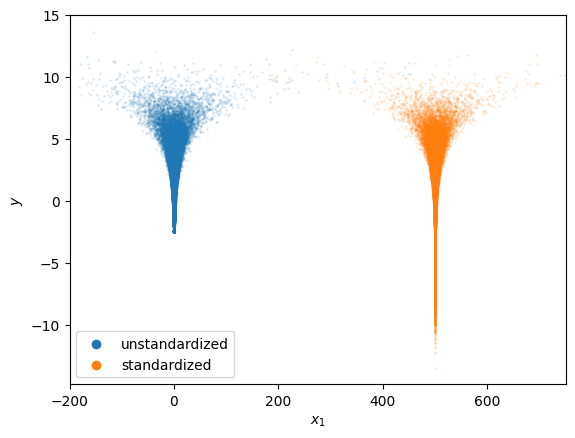

In [6]:
# plot samples
ndx1 = 0
ndx2 = -1
x_labels = np.array([rf'$x_{{{i}}}$' for i in np.arange(1, x_dim + 1)])
labels = np.concatenate((x_labels, np.array([r'$y$'])))
plt.scatter(samples[:, ndx1], samples[:, ndx2], s=1, alpha=0.1)
plt.scatter(500 + samples_st[:, ndx1], samples_st[:, ndx2], s=1, alpha=0.1)
plt.scatter([], [], color='C0', label='unstandardized')
plt.scatter([], [], color='C1', label='standardized')
plt.xlim(-200, 750)
plt.xlabel(labels[ndx1])
plt.ylabel(labels[ndx2])
plt.legend()
plt.show()

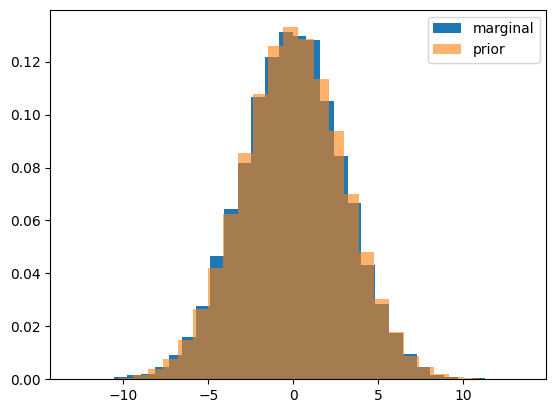

In [7]:
# plot marginal distribution of hyper-parameter y and its prior
plt.hist(samples_st[::10, -1], bins=30, color='C0', density=True, label='marginal')
plt.hist(jr.normal(jr.key(0), 100_000) * 3, bins=30,
         color='C1', alpha=0.6, density=True, label='prior')
plt.legend()
plt.show()

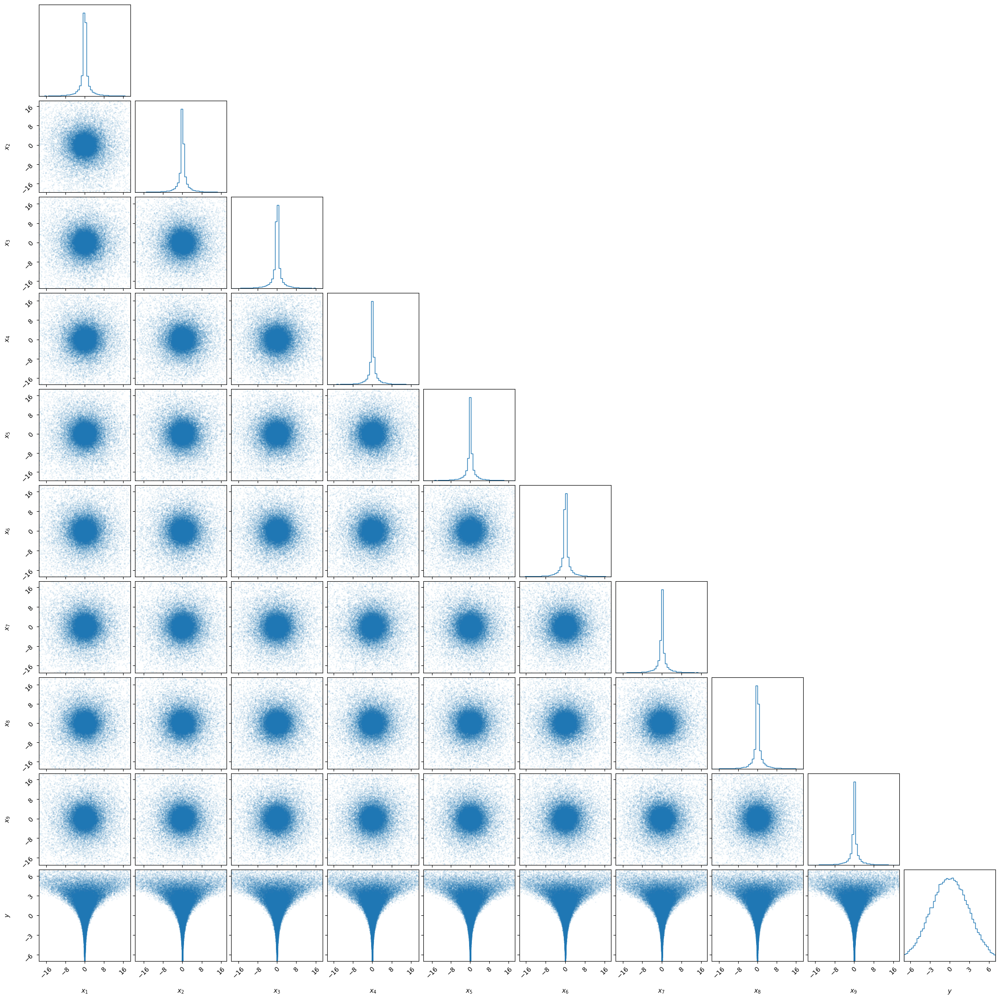

In [8]:
fig = corner(samples_st,
             labels=labels,
             range=[0.98]*samples_st.shape[1],
             color='C0',
             plot_contours=False,
             plot_density=False,
             bins=50)

Instead of sampling over $y$ which leads to a strong funnel, we sample the "extended" density,

\begin{equation*}
    p(\vec{x}, \vec{z}) \propto p(\vec{x} | \vec{z})\cdot p(\vec{z})
\end{equation*}

where $\vec{z}\in\mathbb{R}^d$ with

\begin{equation*}
    p(\vec{x} | \vec{z}) \sim \mathcal{N}(\vec{\mu}=\vec{0}, \Sigma=\text{diag}(\vec{z}))
\end{equation*}

and the log-uniform prior on $\vec{z}$.

In [ ]:
def extended_model():
    # sample in log-z
    log10_z = numpyro.sample('log10_z', dist.Uniform(-4., 4.).expand((x_dim,)))
    # conditional prior on x
    x_standard = numpyro.sample('x_standard', dist.Normal().expand((x_dim,)))
    x = numpyro.deterministic('x', x_standard * jnp.sqrt(10. ** log10_z))

nuts_kernel_extended = numpyro.infer.NUTS(extended_model,
                                          dense_mass=False)
mcmc_extended = numpyro.infer.MCMC(sampler=nuts_kernel_extended,
                                      num_warmup=int(1e4),
                                      num_samples=int(2e5))
mcmc_extended.run(jr.key(2))
samples_dict_extended = mcmc_extended.get_samples()
extended_samples = np.concatenate((samples_dict_extended['x'],
                                   samples_dict_extended['log10_z']),
                                   axis=1)

sample: 100%|██████████| 210000/210000 [01:12<00:00, 2910.49it/s, 7 steps of size 5.66e-01. acc. prob=0.89]


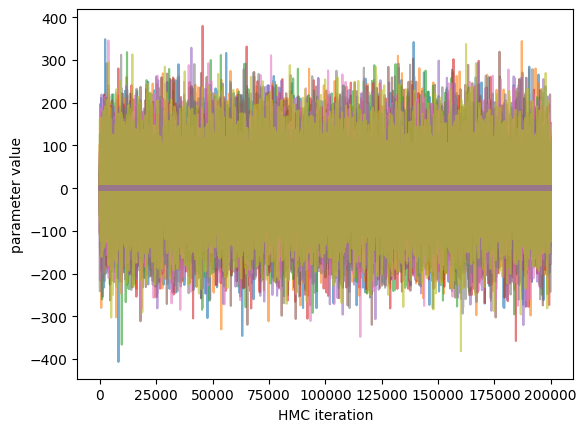

In [10]:
z_labels = np.array([rf'$\log_{{{10}}}\,z_{{{i}}}$' for i in np.arange(1, x_dim + 1)])
extended_labels = np.concatenate((x_labels, z_labels))
for i, label in enumerate(extended_labels):
    plt.plot(extended_samples[:, i], color=f'C{i}',
             alpha=0.6, label=label)
plt.xlabel('HMC iteration')
plt.ylabel('parameter value')
# plt.legend()
plt.show()

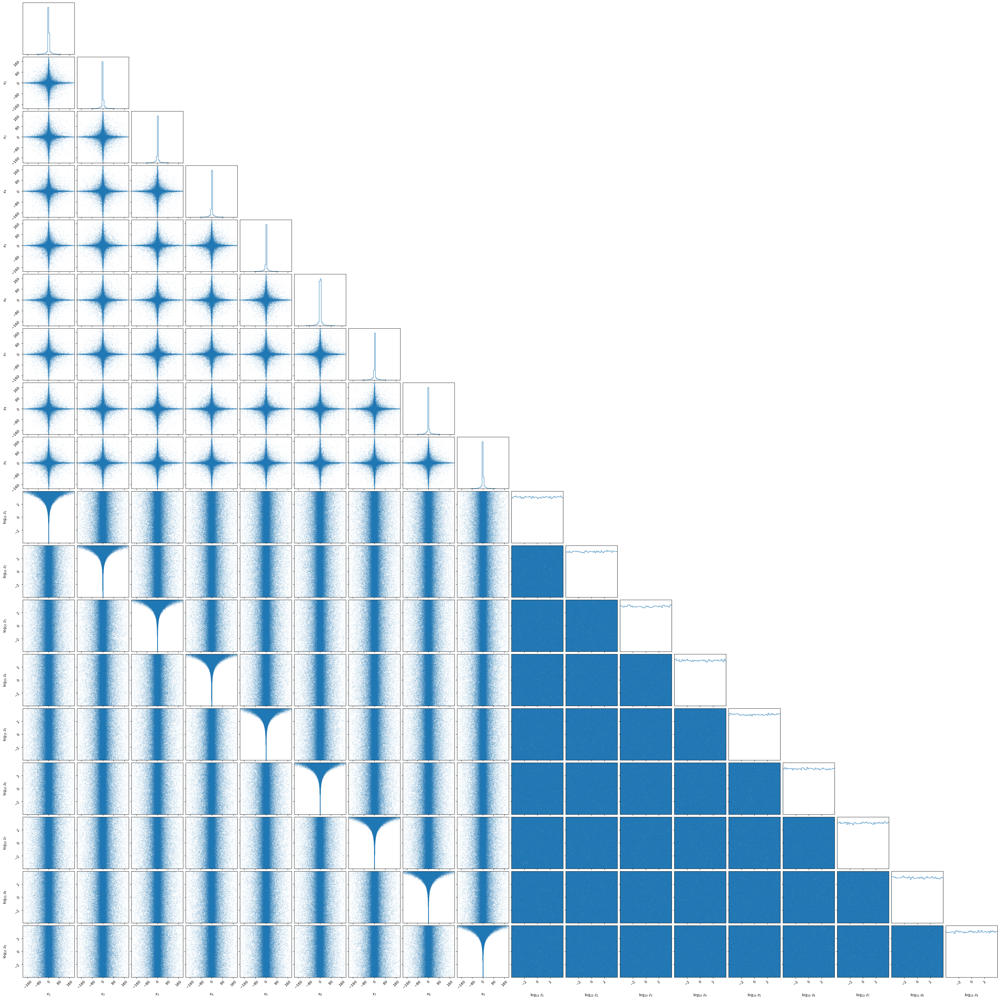

In [11]:
burnin = 0
fig = corner(extended_samples[burnin::1],
             labels=extended_labels,
             range=[0.999]*extended_samples.shape[1],
             color='C0',
             plot_contours=False,
             plot_density=False,
             bins=50)

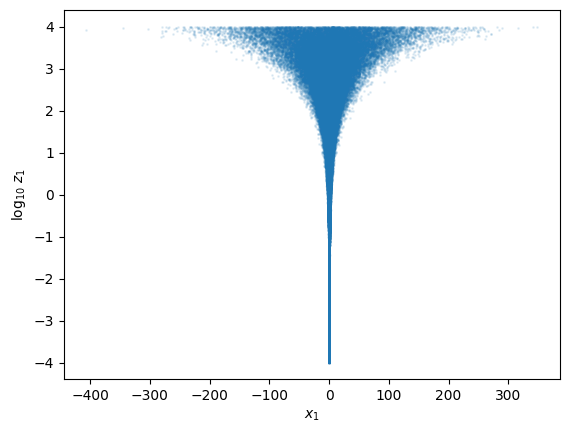

In [12]:
ndx1 = 0
ndx2 = x_dim
plt.scatter(extended_samples[:, ndx1], extended_samples[:, ndx2],
            color='C0', s=1, alpha=0.1)
plt.xlabel(extended_labels[ndx1])
plt.ylabel(extended_labels[ndx2])
plt.show()

## Second stage sampling

Now we model $\vec{z}=e^{y/2}\,\mathbb{I}$. First we need to learn the distribution on $\vec{z}$ with a normalizing flow.

In [15]:
log10_z_samples = extended_samples[:, x_dim:]

In [16]:
log10_z_means = jnp.mean(log10_z_samples, axis=0)
L_cov = jnp.linalg.cholesky(jnp.cov(log10_z_samples.T))
inv_L_cov = jnp.linalg.inv(L_cov)

@jit
def standardize(ln_z_samples):
    return jnp.einsum('ij,ni->nj', inv_L_cov, (ln_z_samples - log10_z_means[None, :]))

@jit
def unstandardize(standard_samples):
    return log10_z_means[None, :] + jnp.einsum('ij,ni->nj', L_cov, standard_samples)

standard_log10_z_samples = standardize(log10_z_samples)

In [45]:
key, subkey = jr.split(jr.key(1))
flow = masked_autoregressive_flow(
    subkey,
    base_dist=Normal(jnp.zeros(standard_log10_z_samples.shape[1]), scale=jnp.ones(standard_log10_z_samples.shape[1])),
    transformer=RationalQuadraticSpline(knots=8, interval=4),
)

In [28]:
key, subkey = jr.split(key)
flow, losses = fit_to_data(subkey, flow, standard_log10_z_samples, learning_rate=1e-3, batch_size=1024)

 29%|██▉       | 29/100 [02:16<05:35,  4.72s/it, train=11.2, val=11.2 (Max patience reached)]


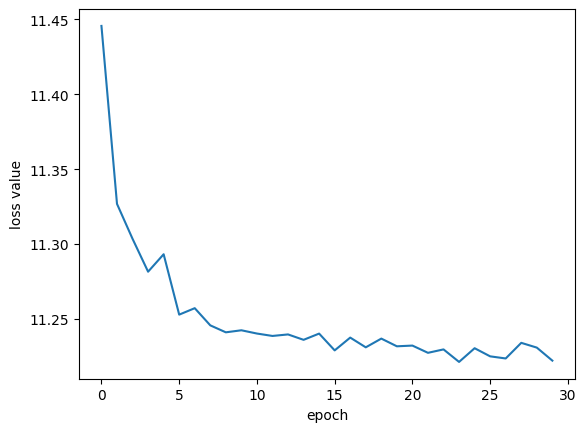

In [29]:
plt.plot(losses['val'])
plt.xlabel('epoch')
plt.ylabel('loss value')
plt.show()

In [30]:
standard_flow_samples = flow.sample(subkey, (500_000,))
flow_samples = unstandardize(standard_flow_samples)

Parameter $\log_{10}\,z_{1}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{1}$ in chain normalizing flow is not constrained
Parameter $\log_{10}\,z_{2}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{3}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{3}$ in chain normalizing flow is not constrained
Parameter $\log_{10}\,z_{4}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{4}$ in chain normalizing flow is not constrained
Parameter $\log_{10}\,z_{5}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{5}$ in chain normalizing flow is not constrained
Parameter $\log_{10}\,z_{6}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{6}$ in chain normalizing flow is not constrained
Parameter $\log_{10}\,z_{7}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{7}$ in chain normalizing flow is not constrained
Parameter $\log_{10}\,z_{8}$ in chain HMC is not constrained
Parameter $\log_{10}\,z_{8}$ in chain normalizing flow is not constr

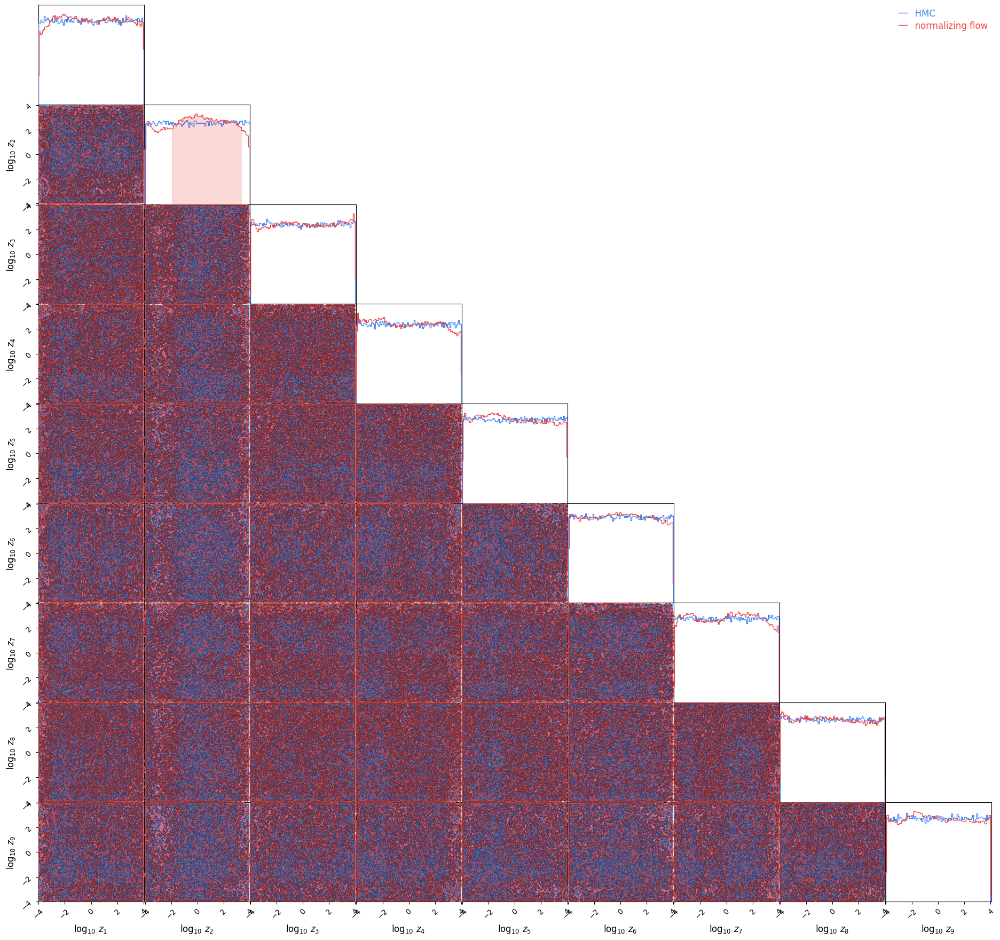

In [32]:
# plot test-tube
cc = ChainConsumer()
df_lnz = pd.DataFrame(log10_z_samples, columns=z_labels)
df_flow = pd.DataFrame(flow_samples, columns=z_labels)
cc.add_chain(Chain(samples=df_lnz, name='HMC', smooth=0, color='blue'))
cc.add_chain(Chain(samples=df_flow, name='normalizing flow', smooth=0, color='red'))
# cc.set_plot_config(PlotConfig(extents={label: (-12, 8) for label in ln_z_labels}))
fig = cc.plotter.plot()

In [38]:
# second stage likelihood
@jit
def second_lnlike(y):
    log10_z = jnp.log10(jnp.exp(jnp.ones(x_dim) * y / 2))
    ln_prob = flow.log_prob(standardize(log10_z))
    return ln_prob

In [39]:
# second stage sampling
def second_sampling_model():

    y_standard = numpyro.sample('y_standard', dist.Normal())
    y = numpyro.deterministic('y', 3. * y_standard)
    numpyro.factor('lnlike', second_lnlike(y))


second_nuts_kernel = numpyro.infer.NUTS(model=second_sampling_model)
second_mcmc = numpyro.infer.MCMC(sampler=second_nuts_kernel,
                                 num_warmup=int(1e4),
                                 num_samples=int(1e5))
second_mcmc.run(jr.key(150914))
y_samples = second_mcmc.get_samples()['y']

sample: 100%|██████████| 110000/110000 [01:23<00:00, 1315.22it/s, 3 steps of size 9.69e-01. acc. prob=0.92]


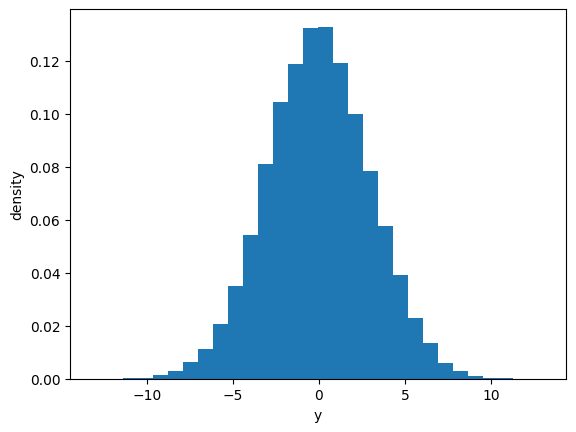

In [40]:
plt.hist(y_samples, density=True, bins=30)
plt.xlabel('y')
plt.ylabel('density')
plt.show()

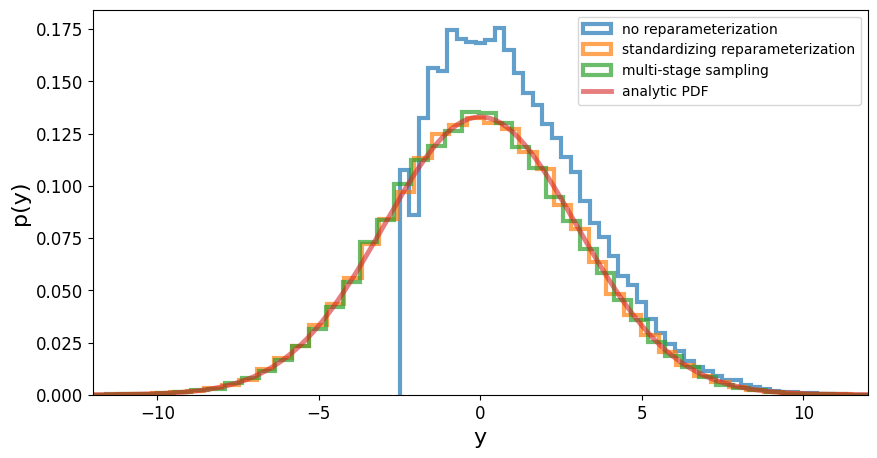

In [43]:
nbins = 50
# plt.hist(jr.normal(jr.key(0), 100_000) * 3, bins=30,
#          color='C2', alpha=0.8, density=True, label='prior')
plt.figure(figsize=(10, 5))
plt.hist(samples_dict['y'], bins=nbins, density=True, lw=3,
         label='no reparameterization', alpha=0.7, histtype='step')
plt.hist(samples_st[:, -1], bins=nbins, density=True, lw=3,
         label='standardizing reparameterization', alpha=0.7, histtype='step')
plt.hist(y_samples, bins=nbins, alpha=0.7, density=True,
         label='multi-stage sampling', histtype='step', lw=3)
plt.plot(np.linspace(-15, 15, 1000), js.stats.norm.pdf(jnp.linspace(-15., 15., 1000), loc=0., scale=3.),
         label='analytic PDF', lw=3.5, alpha=0.6)
plt.xlabel('y', fontsize=16)
plt.ylabel('p(y)', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend()
plt.xlim(-12, 12)
plt.show()